In [1]:
#Importowanie koniecznych Bibliotek
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from skimage import filters
from skimage import morphology
import math

In [2]:
#Wczytywanie obrazów
dt=[('0' if x<10 else '')+str(x) for x in range(1, 15)]
dy=[[y+'_'+x for y in dt] for x in ['dr', 'h', 'g']]
z=[]
for x in dy:
    z=z+x
print(z)

flag=cv2.IMREAD_GRAYSCALE
#flag=cv2.IMREAD_COLOR
Manuals = [cv2.imread(f"manual1/{x}.tif", flag) for x in z]
Masks= [cv2.imread(f"mask/{x}_mask.tif", flag) for x in z]
Images= [cv2.imread(f"images/{x}.jpg", flag) for x in z]

Creation=list(zip(Manuals, Masks, Images))

['01_dr', '02_dr', '03_dr', '04_dr', '05_dr', '06_dr', '07_dr', '08_dr', '09_dr', '10_dr', '11_dr', '12_dr', '13_dr', '14_dr', '01_h', '02_h', '03_h', '04_h', '05_h', '06_h', '07_h', '08_h', '09_h', '10_h', '11_h', '12_h', '13_h', '14_h', '01_g', '02_g', '03_g', '04_g', '05_g', '06_g', '07_g', '08_g', '09_g', '10_g', '11_g', '12_g', '13_g', '14_g']


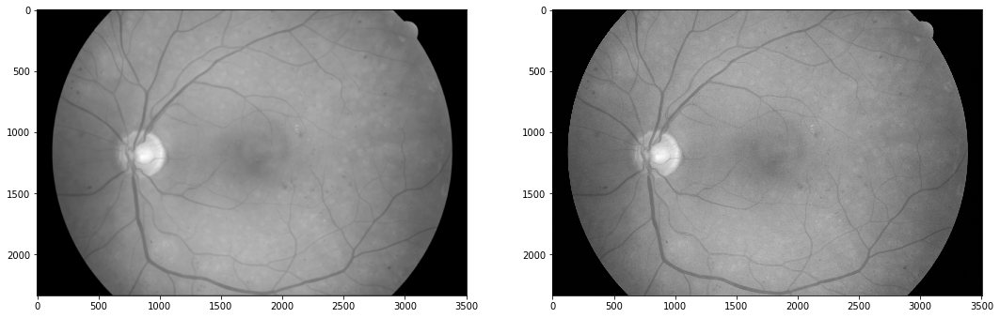

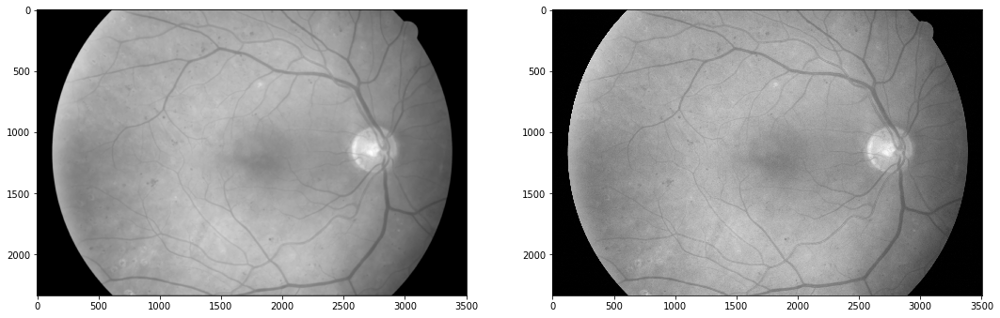

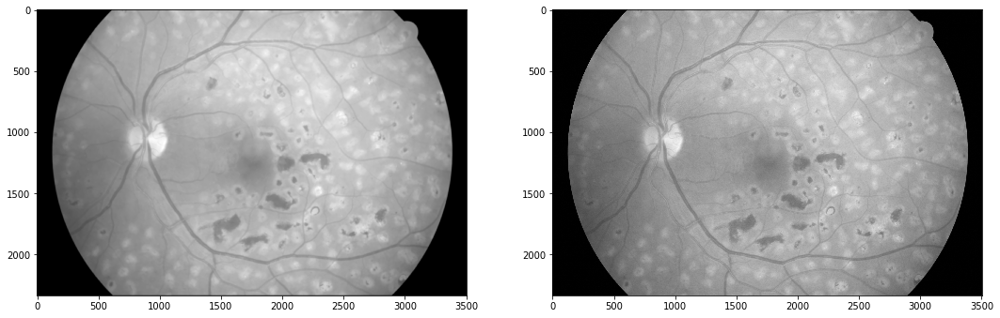

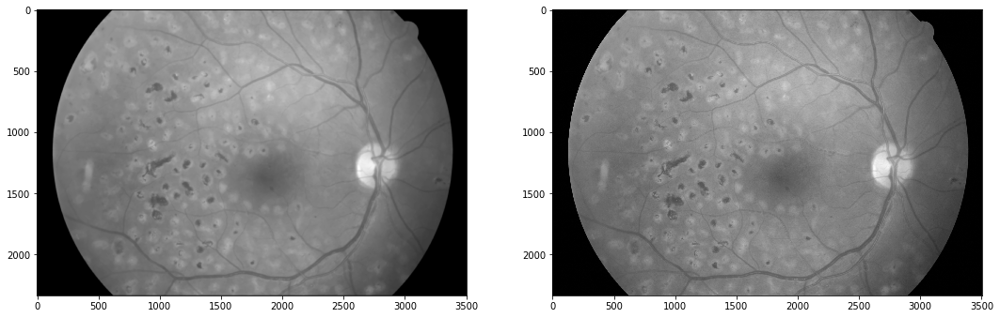

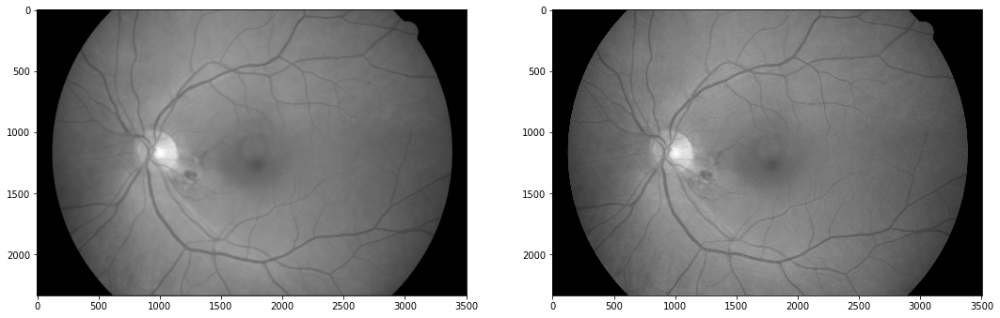

...

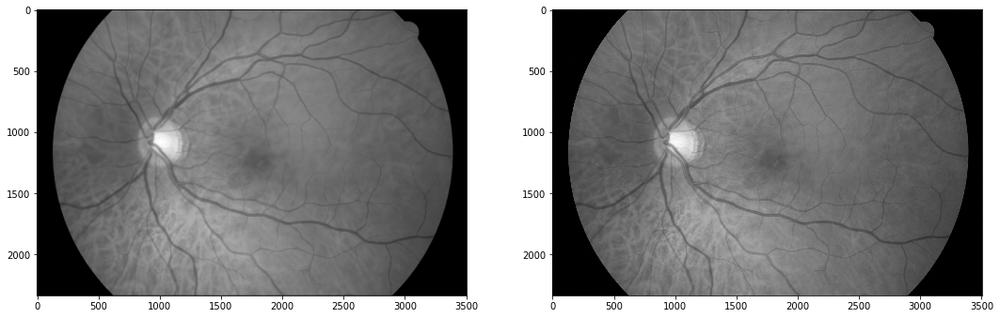

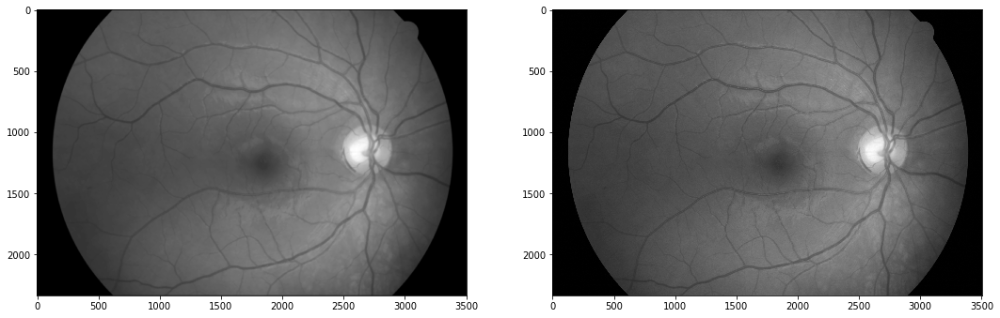

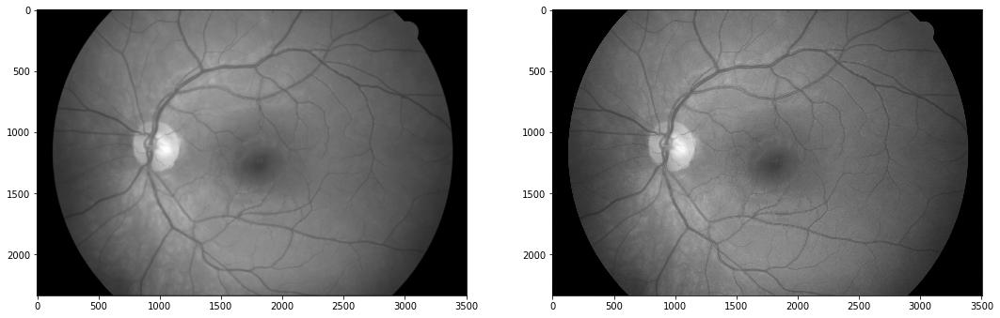

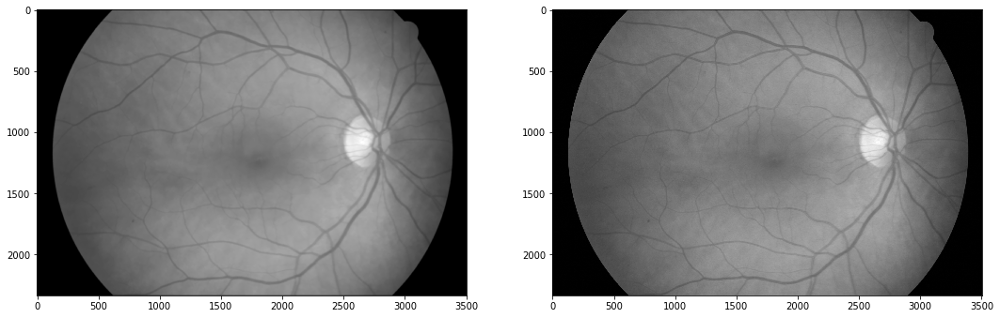

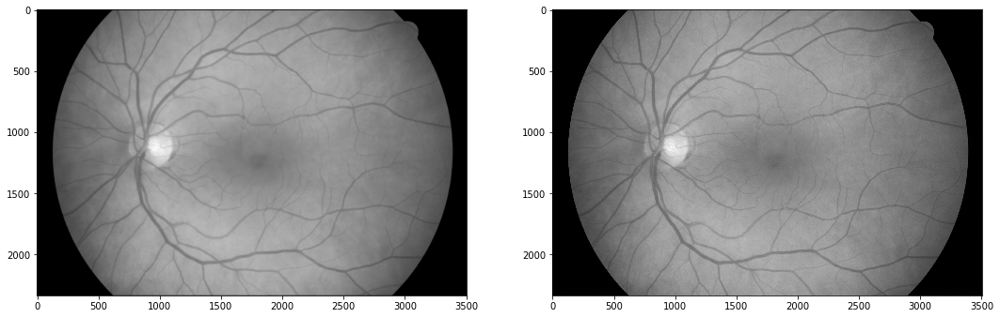

In [3]:
#Wstępne przetwarzanie obrazów

blurk=np.asarray([[1, 1, 1], [1, 1, 1], [1, 1, 1]])/9
blurk2=np.asarray([[1, 4, 6, 4, 1], [4, 16, 24, 16, 4], [6, 24, 36, 24, 6], [4, 16, 24, 16, 4], [1, 4, 6, 4, 1]])/256

res=[]
for x in Creation[:20]:
    sv=x[2]
    
    #####  NORMALIZACJA  #####
    mx, mn=max(sv[sv>-1]), min(sv[sv>-1])
    sv=(sv-mn)/(mx-mn)
    sv=np.multiply(sv, x[1]/255)
    sv=np.asarray(sv*255, dtype='uint8')
    
    #####  DENOISING  #####
    raka=sv
    raka=np.asarray(raka, dtype='uint8')
    raka=cv2.fastNlMeansDenoising(raka)
    
    #####  BLURRING  #####
    dt=np.absolute(signal.convolve2d(raka, blurk2, mode='same'))
    dt[dt>255]=255
    for i in range(10): 
        dt=np.absolute(signal.convolve2d(dt, blurk2, mode='same'))
        dt[dt>255]=255
    
    #Rezultat - używany w następnych fazach algorytmu
    res.append(dt)
    
    #Pokaznanie: Po i przed
    fig, ax=plt.subplots(1, 2, figsize=(18,18))
    ax[1].imshow(x[2], cmap='gray')
    ax[0].imshow(dt, cmap='gray')
    plt.show()

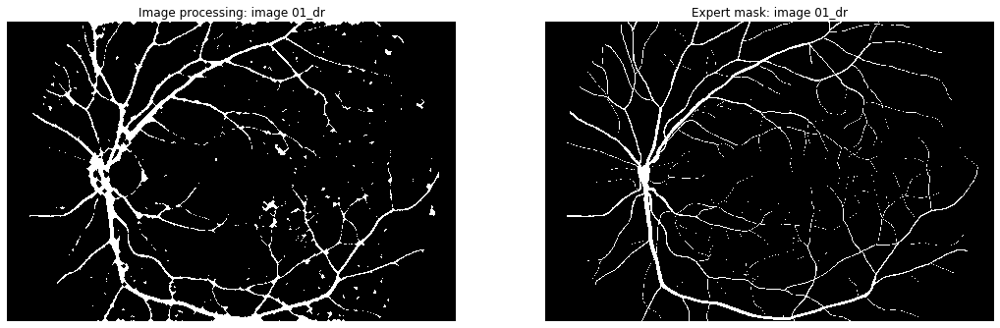

tp 305250
tn 7460420
fp 308642
fn 111032
acc:0.948728605663977, prec:0.4972372990688916, rec:0.7332769612906636, geom:0.603831645164125


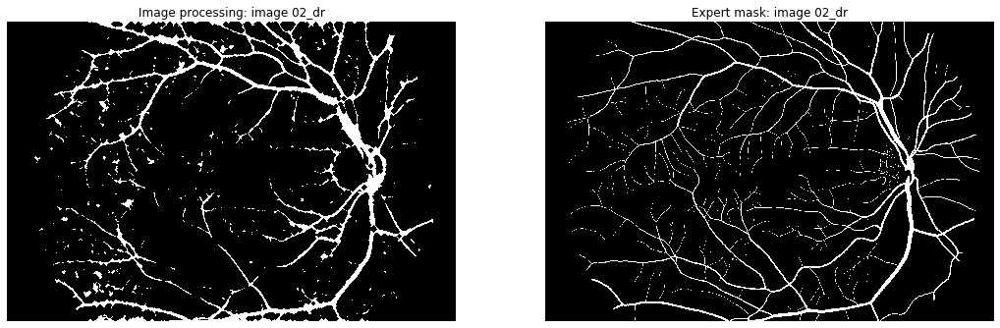

tp 342994
tn 7292673
fp 370793
fn 178884
acc:0.9328461943688622, prec:0.4805271040240296, rec:0.6572302338860807, geom:0.5619759256109768


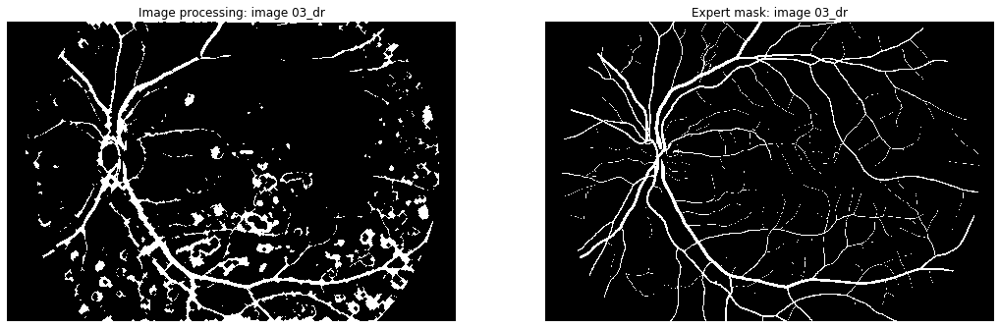

tp 267790
tn 7150689
fp 540255
fn 226610
acc:0.906312428652968, prec:0.3314048103756598, rec:0.5416464401294498, geom:0.4236794021211693


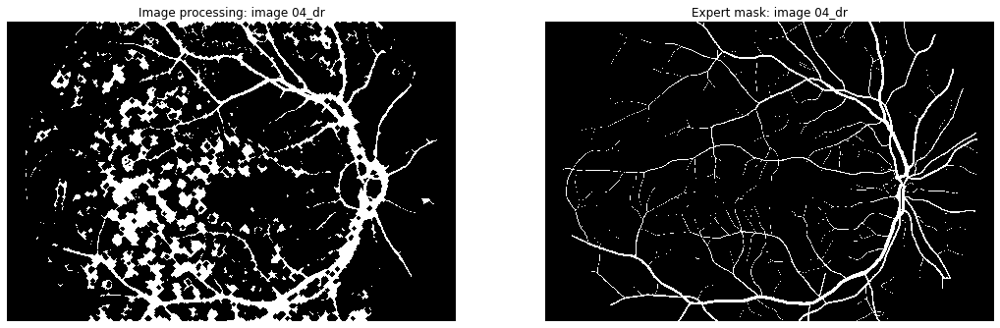

tp 318585
tn 6729966
fp 993199
fn 143594
acc:0.8611184820088197, prec:0.24286391662041923, rec:0.6893108514233662, geom:0.40915612319215583


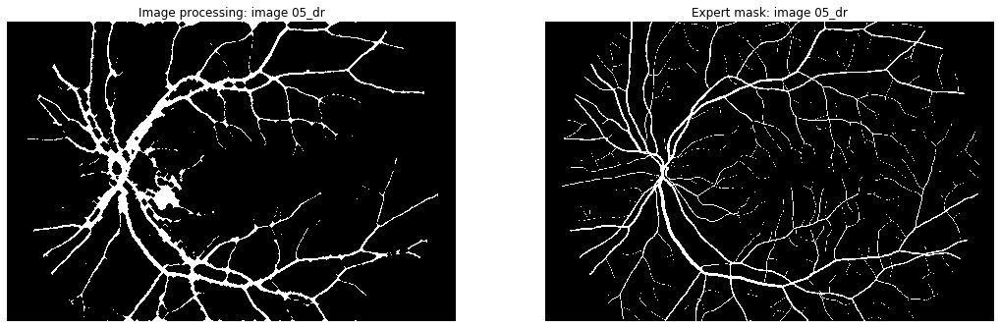

tp 367518
tn 7374879
fp 301487
fn 141460
acc:0.9458853531384875, prec:0.5493501543336746, rec:0.7220705020649223, geom:0.6298170700680944


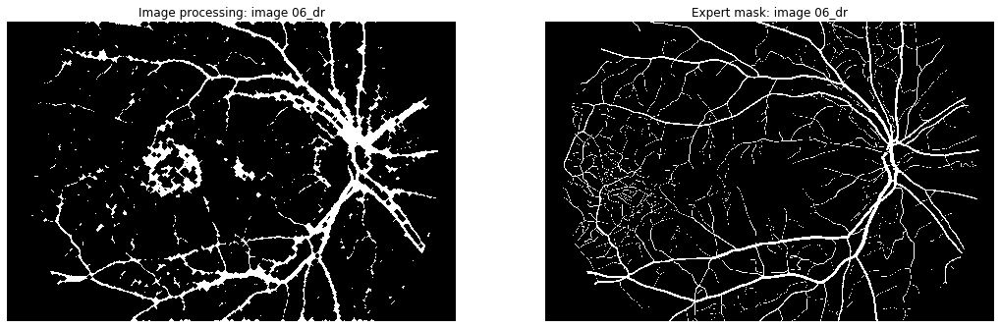

tp 357308
tn 7115321
fp 452057
fn 260658
acc:0.9129279111543754, prec:0.4414670760410939, rec:0.5782000951508659, geom:0.5052289633155793


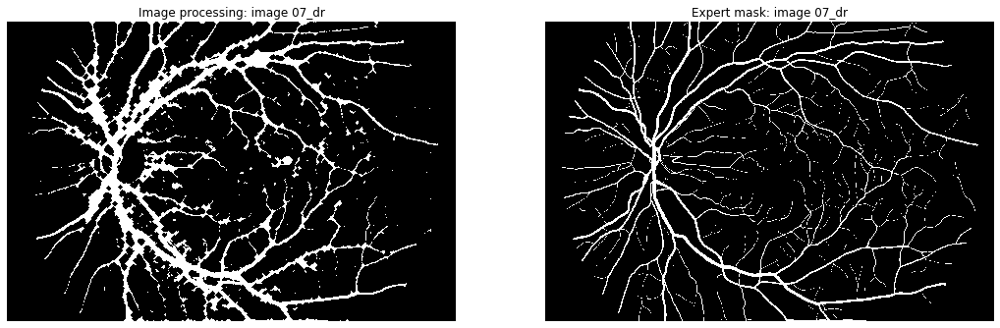

tp 508672
tn 6931136
fp 617849
fn 127687
acc:0.9089181835241134, prec:0.4515424035592768, rec:0.7993475381034919, geom:0.6007822472697086


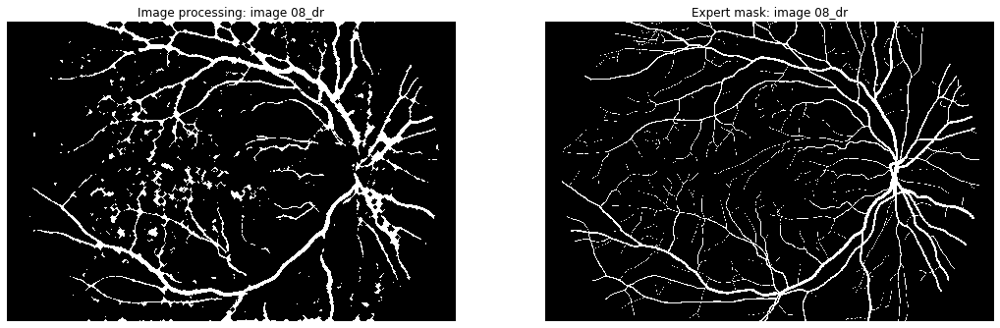

tp 404988
tn 7166842
fp 402725
fn 210789
acc:0.9250472551917183, prec:0.5014008688729784, rec:0.6576861428731505, geom:0.574251167593341


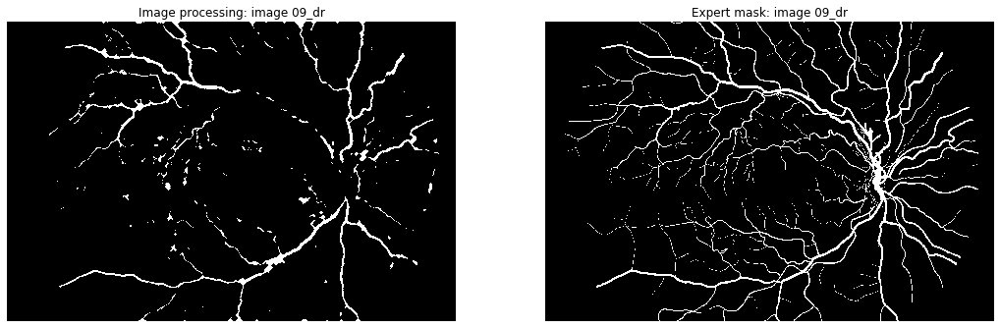

tp 219287
tn 7525484
fp 105413
fn 335160
acc:0.946175383710202, prec:0.6753526331998768, rec:0.39550579225787136, geom:0.5168228693151619


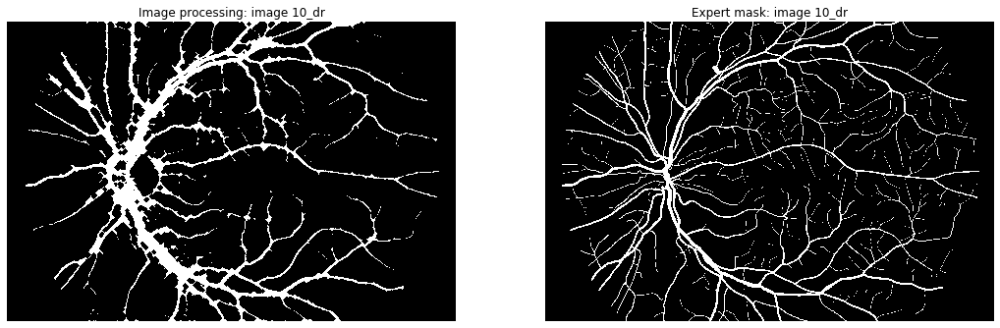

tp 511777
tn 7055860
fp 414595
fn 203112
acc:0.9245349981625696, prec:0.5524530102377878, rec:0.7158831650787745, geom:0.6288813954366309


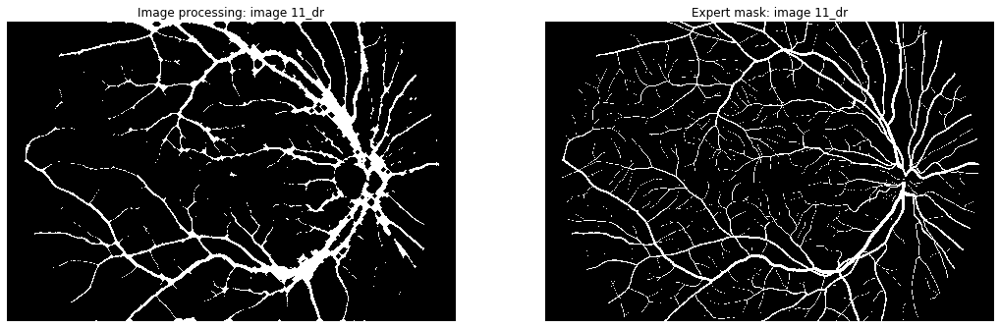

tp 476029
tn 7165393
fp 327014
fn 216908
acc:0.9335492802745982, prec:0.5927814575309168, rec:0.6869729860001703, geom:0.6381417146101226


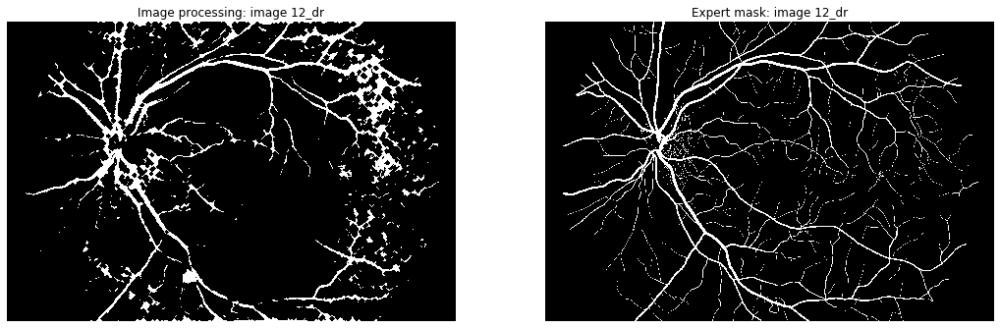

tp 332399
tn 7180235
fp 448385
fn 224325
acc:0.9178153050134484, prec:0.4257246562429558, rec:0.5970624582378342, geom:0.5041668471735088


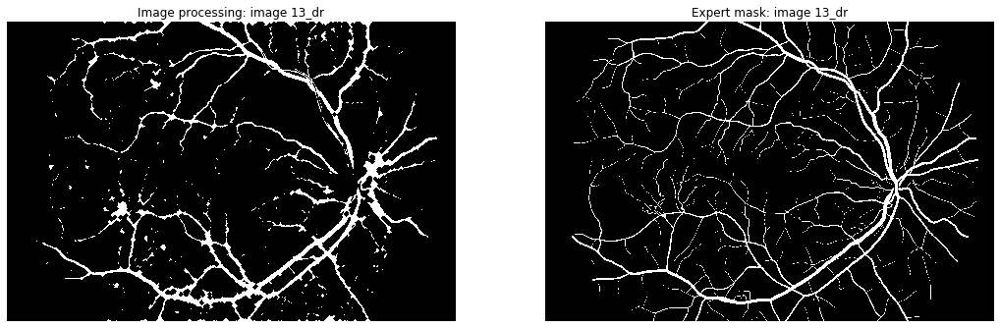

tp 363293
tn 7330776
fp 295089
fn 196186
acc:0.9399811419043598, prec:0.5517966773089179, rec:0.6493416196139623, geom:0.5985854560055529


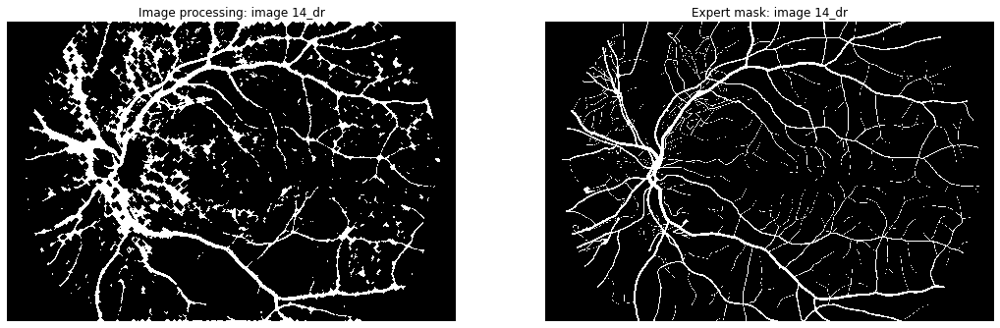

tp 452117
tn 6875380
fp 685028
fn 172819
acc:0.8951971963548508, prec:0.39758957740657525, rec:0.7234612824353214, geom:0.5363214200024817


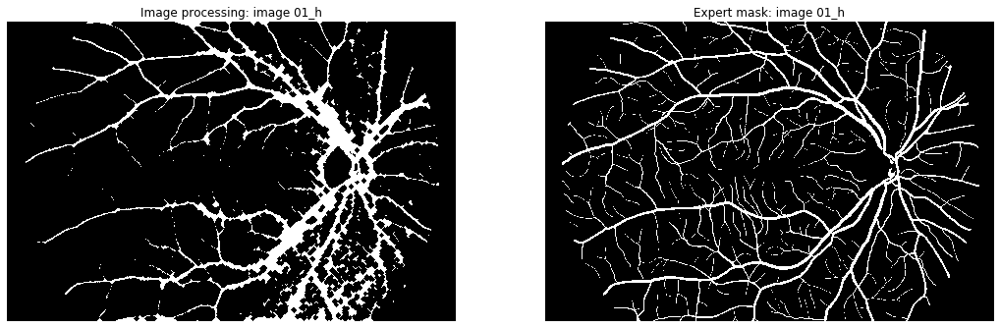

tp 535643
tn 6877202
fp 474254
fn 298245
acc:0.905624125265841, prec:0.5303936936142993, rec:0.6423440557964619, geom:0.5836910452671644


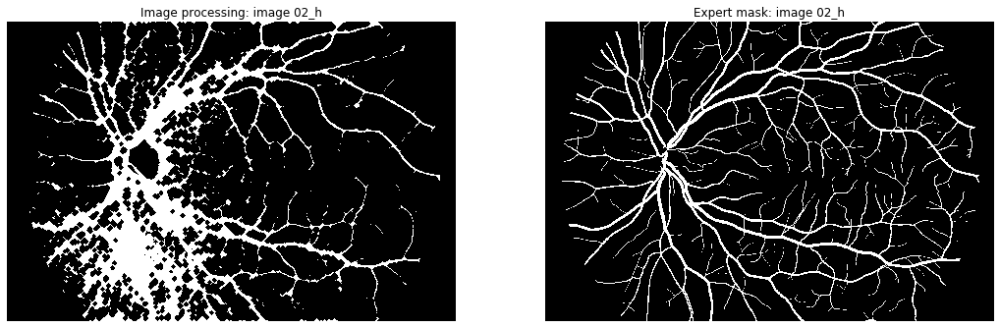

tp 580357
tn 6516935
fp 859971
fn 228081
acc:0.867073149277538, prec:0.40293391505268245, rec:0.7178744690378236, geom:0.5378252228426778


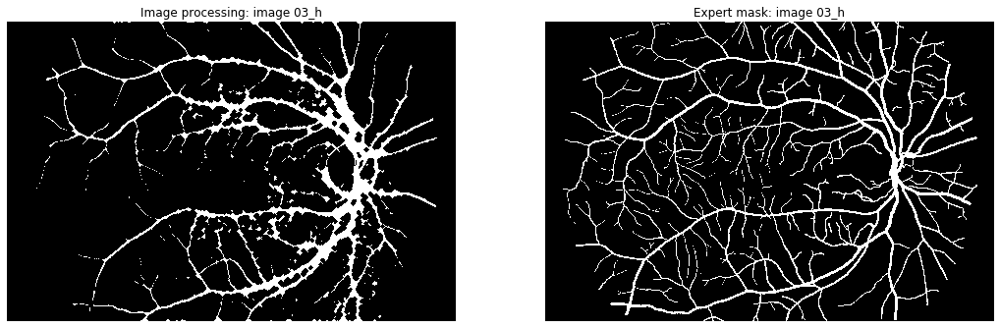

tp 494976
tn 7020955
fp 300218
fn 369195
acc:0.9182180981031463, prec:0.6224594249956614, rec:0.5727755270658238, geom:0.5971009338704635


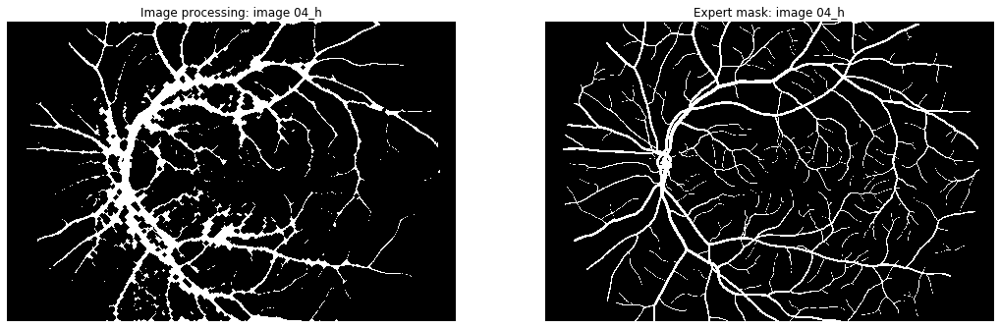

tp 526077
tn 6993019
fp 420724
fn 245524
acc:0.9186047648089073, prec:0.5556362952721849, rec:0.6817992719034838, geom:0.6154936405518133


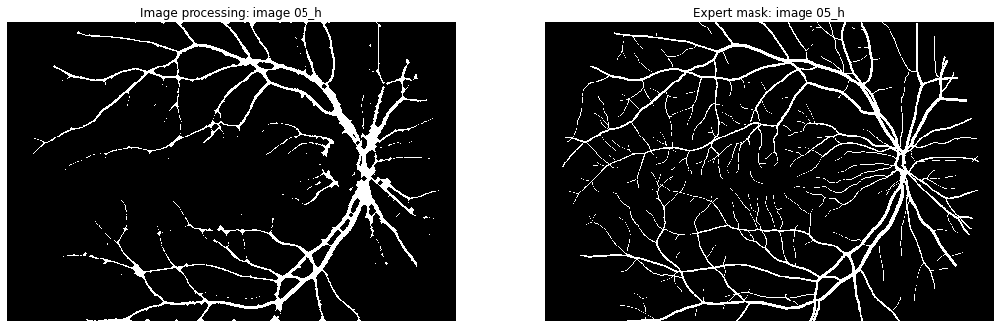

tp 458840
tn 7310816
fp 135742
fn 279946
acc:0.9492155735910427, prec:0.7717018005926852, rec:0.621072949406188, geom:0.6923027613379603


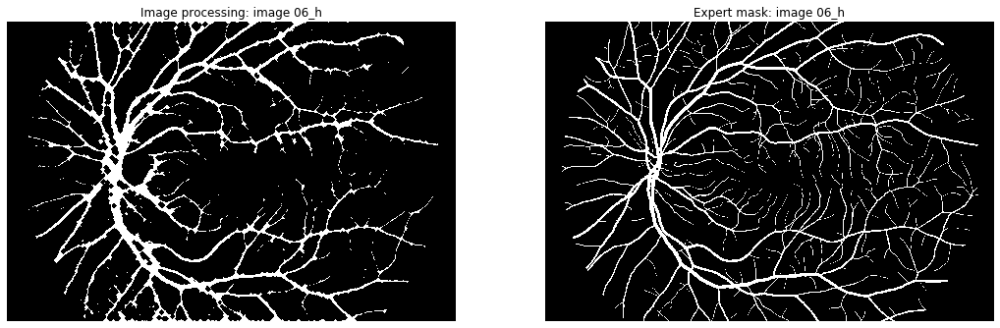

tp 611006
tn 7048768
fp 306706
fn 218864
acc:0.9357913363201351, prec:0.6657927541538086, rec:0.7362671261763891, geom:0.7001437836115435
result: 0.5729099817180116


In [4]:
#Kernele do konwolucji, tutaj nieużywane - prewitt okazał się skuteczniejszy
edgek0=np.asarray([[-1, 0, 1], [0, 0, 0], [1, 0, -1]])
edgek1=np.asarray([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])
edgek1=-1*np.asarray([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])
edgek2=np.asarray([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])

nres=[]
#Wypisywanie rezultatu przetwarzania - porównanie dwóch tablic
def evaluator(im1, im2):
    dicc={}
    #Ile białych/czarnych elementów w poszczególnych obrazach
    dicc["1st B"]=len(im1[im1==0])
    dicc["1st W"]=len(im1[im1!=0])
    dicc["2nd B"]=len(im2[im2==0])
    dicc["2nd W"]=len(im2[im2!=0])
    
    #True Positive, False positive, True negative, False negative: wypis na output tych wartości
    dicc["tp"]=len(im2[(im2==im1) & (im2!=0)])
    dicc["tn"]=len(im2[(im2==im1) & (im2==0)])
    dicc["fp"]=len(im2[(im2!=im1) & (im2!=0)])
    dicc["fn"]=len(im2[(im2!=im1) & (im2==0)])
    _=[print(x, dicc[x]) for x in ["tp", "tn", "fp", "fn"]]
    if (dicc["fn"]==0):
        dicc["fn"]=1
    
    #Accuracy, precision, recall
    dicc["acc"]=(dicc["tp"]+dicc["tn"])/(dicc["tp"]+dicc["tn"]+dicc["fp"]+dicc["fn"])
    dicc["prec"]=dicc["tp"]/(dicc["tp"]+dicc["fp"])
    dicc["rec"]=dicc["tp"]/(dicc["tp"]+dicc["fn"])
    
    return dicc


ln, sgeom=20, 0
allres=[]
for i, x in enumerate(res[:ln]):
    x=x.copy()
    x=np.asarray(x, dtype='uint8')
    
    #####  WYKRYWANIE KRAWĘDZI  #####
    kx=filters.prewitt(x)
    kx[kx>0.003]=1
    #####  EROZJA MASKI OBIEKTYWU  #####
    ds=x
    for j in range(12):
        ds=morphology.binary_erosion(ds)
    kx[ds==0]=0
    
    #####  ZMNIEJSZANIE GRUBOŚCI I WYPEŁNIANIE KRAWĘDZI #####
    kx=morphology.closing(kx, morphology.diamond(10))
    kx=morphology.erosion(kx, morphology.diamond(8))
    
    #####  USUWANIE KRAWĘDZI Z JASNYCH ELEMENTÓW OBRAZKA #####
    kx[x>165]=0
    nres.append(kx)
    
    fig, ax=plt.subplots(1, 2, figsize=(18,18))
    ax[1].imshow(Creation[i][0], cmap='gray')
    ax[0].imshow(kx, cmap='gray')
    
    
    ax[0].set_title(f"Image processing: image {z[i]}")
    ax[1].set_title(f"Expert mask: image {z[i]}")
    ax[1].set_axis_off()
    ax[0].set_axis_off()


    plt.show() 
    
    #####  EWALUACJA #####
    dct=evaluator(Creation[i][0], np.asarray(kx*255, dtype='uint8'))
    print(f"acc:{dct['acc']}, prec:{dct['prec']}, rec:{dct['rec']}, geom:{math.sqrt(dct['prec']*dct['rec'])}")
    sgeom=sgeom+math.sqrt(dct['prec']*dct['rec'])
    dct['sgeom']=math.sqrt(dct['prec']*dct['rec'])
    dct['title']=f'RFC-{z[i]}'
    allres.append(dct)
print(f"result: {sgeom/ln}")

In [5]:
#Dane częściowe klasyfikatora
allez={}
for x in allres:
    print(f"{x['title']} & {x['tp']} & {x['tn']} & {x['fn']} & {x['fp']} & {x['acc']:.4f} & {x['prec']:.4f} & {x['rec']:.4f} & {x['sgeom']:.4f} \\\\ \hline")
    for y in x:
          if y not in allez:
              allez[y]=x[y]
          else:
              allez[y]+=x[y]

RFC-01_dr & 305250 & 7460420 & 111032 & 308642 & 0.9487 & 0.4972 & 0.7333 & 0.6038 \\ \hline
RFC-02_dr & 342994 & 7292673 & 178884 & 370793 & 0.9328 & 0.4805 & 0.6572 & 0.5620 \\ \hline
RFC-03_dr & 267790 & 7150689 & 226610 & 540255 & 0.9063 & 0.3314 & 0.5416 & 0.4237 \\ \hline
RFC-04_dr & 318585 & 6729966 & 143594 & 993199 & 0.8611 & 0.2429 & 0.6893 & 0.4092 \\ \hline
RFC-05_dr & 367518 & 7374879 & 141460 & 301487 & 0.9459 & 0.5494 & 0.7221 & 0.6298 \\ \hline
RFC-06_dr & 357308 & 7115321 & 260658 & 452057 & 0.9129 & 0.4415 & 0.5782 & 0.5052 \\ \hline
RFC-07_dr & 508672 & 6931136 & 127687 & 617849 & 0.9089 & 0.4515 & 0.7993 & 0.6008 \\ \hline
RFC-08_dr & 404988 & 7166842 & 210789 & 402725 & 0.9250 & 0.5014 & 0.6577 & 0.5743 \\ \hline
RFC-09_dr & 219287 & 7525484 & 335160 & 105413 & 0.9462 & 0.6754 & 0.3955 & 0.5168 \\ \hline
RFC-10_dr & 511777 & 7055860 & 203112 & 414595 & 0.9245 & 0.5525 & 0.7159 & 0.6289 \\ \hline
RFC-11_dr & 476029 & 7165393 & 216908 & 327014 & 0.9335 & 0.5928 & 0.6

In [6]:
#Dane całościowe klasyfikatora
for x in allez:
    if x in ['prec', 'acc', 'rec']:
        print(f"{allez[x]/len(allres):.4f} &", end=' ')
    elif x=='sgeom':
        print(f"{allez[x]/len(allres):.4f}")

0.9197 & 0.5120 & 0.6560 & 0.5729


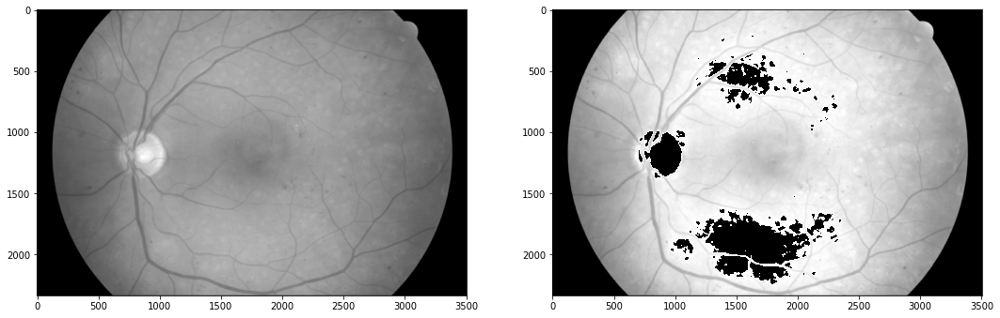

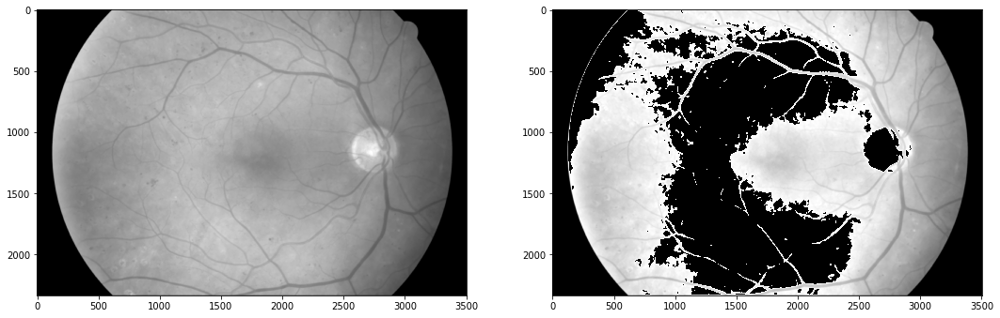

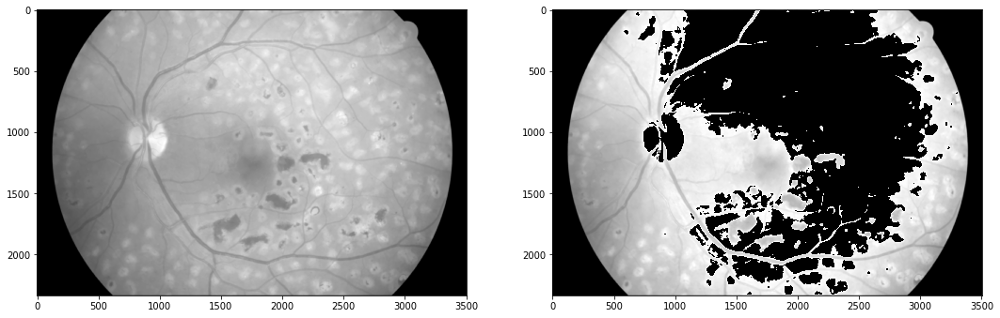

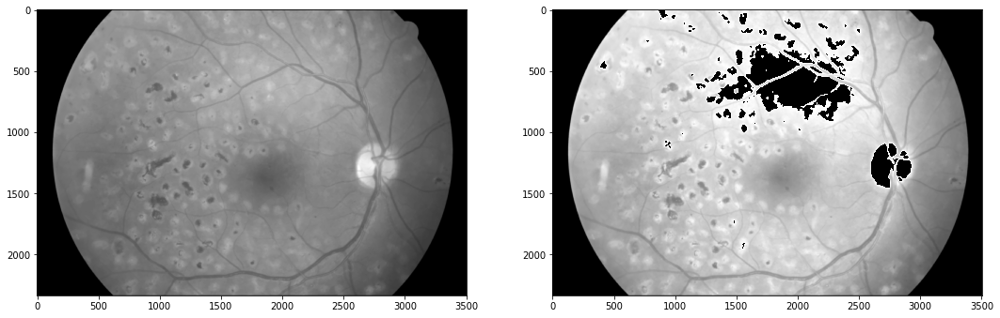

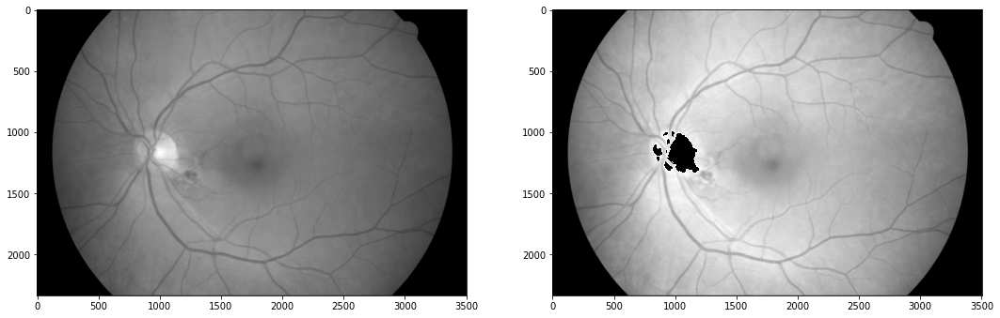

...

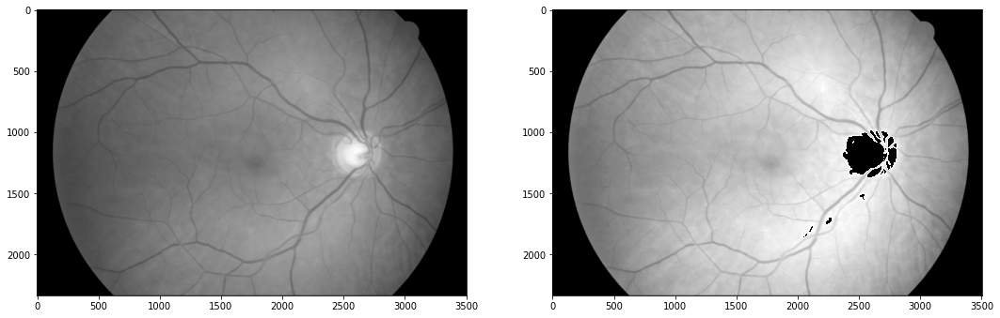

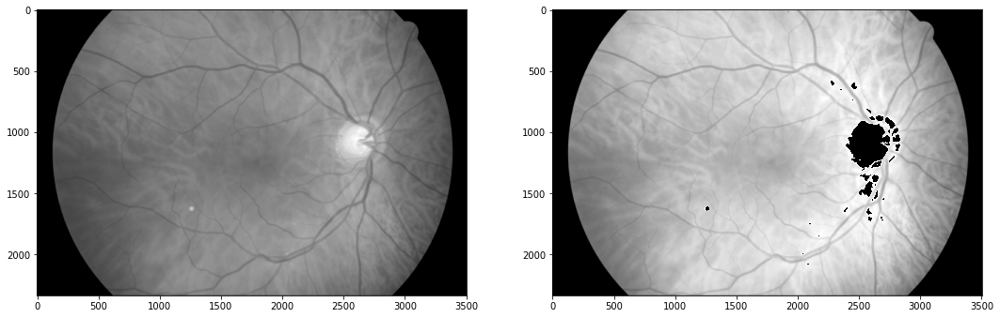

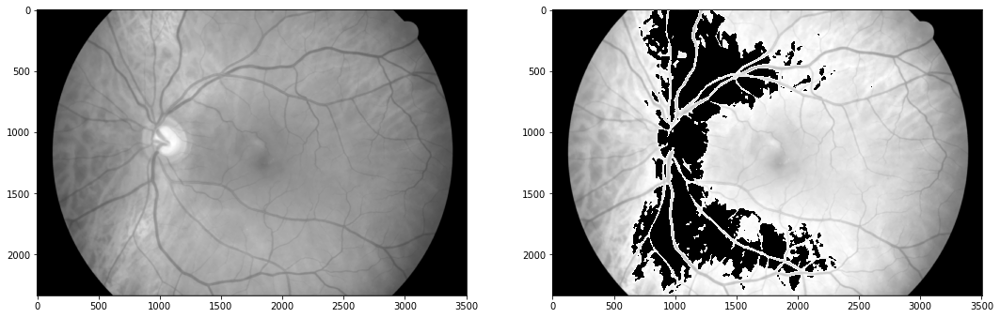

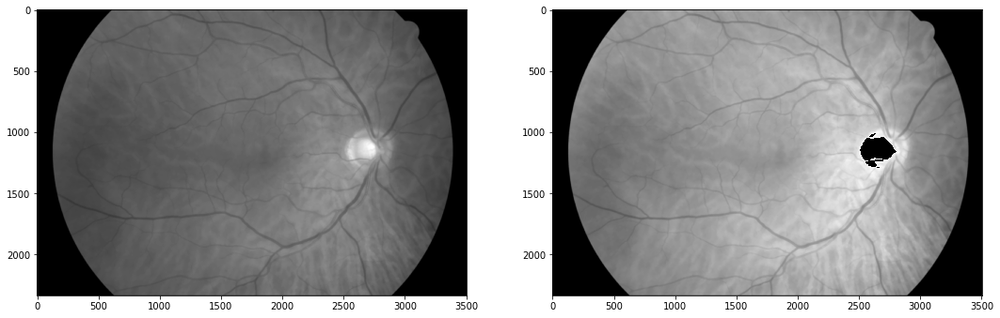

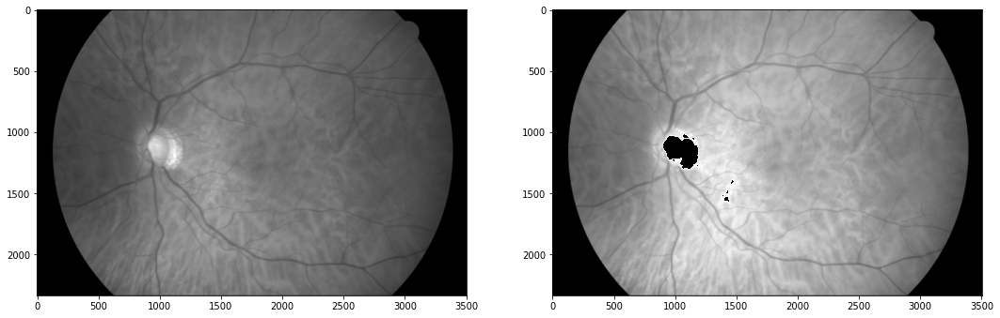

In [367]:
#Pokaz skuteczności thresholdingu koloru białego
for x in res:
    x=x.copy()
    fig, ax=plt.subplots(1, 2, figsize=(18,18))
    ax[0].imshow(x, cmap='gray')
    x[x>165]=0
    
    ax[1].imshow(x, cmap='gray')
    plt.show()
    